# Relativistic average GAN with Keras custom layers
This python notebook is using custom layers in Keras to implement Relativistic average GAN.
- Pros: 
    - Easly using keras default loss to train our RaGAN
- Cons: 
    - Write custom layers to implement it.

## Let install and import some package

### Install pydot and graphviz for keras model visualization
If you using google colab, please restart your runtime after you install pydot and graphviz

In [1]:
!apt install graphviz
!pip install -q pydot

E: Could not open lock file /var/lib/dpkg/lock - open (13: Permission denied)
E: Unable to lock the administration directory (/var/lib/dpkg/), are you root?


### Import packege

In [2]:
% matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import Input, Dense, Lambda, Conv2D, Conv2DTranspose, Activation, LeakyReLU, Concatenate
from keras.layers import BatchNormalization, GlobalAveragePooling2D, Reshape
import keras.backend as K
from keras.models import Model
from keras.utils import plot_model
from keras.optimizers import *
from keras.utils.generic_utils import Progbar
from time import time
import sys
import os
import pickle

Using TensorFlow backend.


### for model visualization

In [3]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

## Some model strature, hyperperemeter and dataset choosing

In [4]:
EPOCHS = 100
BATCHSIZE = 64
TRAINING_RATIO =1
DATASET = 'fashion_mnist' # 'mnist', 'fashion_mnist'  'cifar10'
LOSS = 'BXE' #'BXE' 'LS'
GENERATE_ROW_NUM = 10
OPT = Adam(lr=0.0002, beta_1=0.5, beta_2=0.999)

### load dataset

In [5]:
from keras.datasets import mnist, fashion_mnist, cifar10
exec('(X_train, y_train), (X_test, y_test) = {}.load_data()'.format(DATASET))

### Conatenate train set and test set for more data, reshape for model input and normalize it (here we use linear normalization)

In [6]:
X = np.concatenate((X_train, X_test))
if len(X.shape)==3:
    X = np.expand_dims(X, axis=-1)
X = X/255*2-1

## Build model stucture. Here we use DCGAN stucture

In [7]:
def DC_Generator(input_shape=(128,) ,output_shape=(28,28,1), dc_shape=(7,7,128), name='Generator'):
    layer_num=int(np.log2(output_shape[1]/dc_shape[1]))
    
    z = Input(shape=input_shape)
    h = Dense(dc_shape[0]*dc_shape[1]*dc_shape[2], activation='relu',kernel_initializer='glorot_uniform')(z)
    h = Reshape(dc_shape)(h) 
    for i in range(layer_num):  
        h = Conv2DTranspose(int(dc_shape[2]/(2**(i+1))), kernel_size=4, strides=2, padding='same', activation='relu',kernel_initializer='glorot_uniform')(h)
        h = BatchNormalization(momentum=0.9, epsilon=0.00002)(h)
    
    x = Conv2DTranspose(output_shape[-1], kernel_size=3, strides=1, padding='same', activation='tanh',kernel_initializer='glorot_uniform')(h)
    model = Model(z,x, name=name)
    model.summary()
    return model

def DC_Discriminator(input_shape=(28,28,1),layer_num=2, start_dim=64, name='Discriminator'):
    
    x = Input(shape=input_shape)
    h = x
    for i in range(layer_num):
        h = Conv2D(start_dim*(2**i), kernel_size=4, strides=2, padding='same',kernel_initializer='glorot_uniform')(h)
        h = LeakyReLU(0.1)(h)       
    
    h = GlobalAveragePooling2D()(h)
    y = Dense(1,kernel_initializer='glorot_uniform' )(h)
    model = Model(x,y, name=name)
    model.summary()
    return model

In [8]:
if X.shape[2] == 28:
    dc_shape = (7,7,128)
    dis_layer_num = 2
else:
    dc_shape = (4,4,512)
    dis_layer_num = 4
generator = DC_Generator(output_shape=X.shape[1:], dc_shape=dc_shape)
discriminator = DC_Discriminator(input_shape=X.shape[1:], layer_num=dis_layer_num)

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 128)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6272)              809088    
_________________________________________________________________
reshape_1 (Reshape)          (None, 7, 7, 128)         0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 14, 14, 64)        131136    
_________________________________________________________________
batch_normalization_1 (Batch (None, 14, 14, 64)        256       
_________________________________________________________________
conv2d_transpose_2 (Conv2DTr (None, 28, 28, 32)        32800     
_________________________________________________________________
batch_normalization_2 (Batch (None, 28, 28, 32)        128       
__________

## *Custom Layers*
### Lambda layer for relativistic average
We need to average $C(x_{real})$ and $C(x_{fake})$. 
and minus with each other to get $C(x_{real})-\mathbb{E}_{x_{fake}\sim\mathbb{P}_{fake}}C(x_{fake})$ and $C(x_{fake})-\mathbb{E}_{x_{real}\sim\mathbb{P}_{real}}C(x_{real})$.

In [9]:
def relativistic_average(input_):
    x_0 = input_[0]
    x_1 = input_[1]
    return x_0 - K.mean(x_1, axis=0)

### Simple test

In [10]:
x_0 = Input(shape=(1,))
x_1 = Input(shape=(1,))
y = Lambda(relativistic_average)([x_0, x_1])
model = Model([x_0,x_1],y)
model.summary()
pre = model.predict([np.array([[9],[4],[8],[7]]), np.array([[5],[5],[6],[6]])])
print('lambda out:', pre)
print('numpy out:', np.array([[9],[4],[8],[7]])-np.mean(np.array([[5],[5],[6],[6]])))

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
input_4 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 1)            0           input_3[0][0]                    
                                                                 input_4[0][0]                    
Total params: 0
Trainable params: 0
Non-trainable params: 0
__________________________________________________________________________________________________
lambda out: [[ 3.5]
 [-1.5]
 [ 2.5]
 [ 1.5]]
nump

## Build two models for training 

In [11]:
Real_image                         = Input(shape=X.shape[1:])
Noise_input                        = Input(shape=(128,))
Fake_image                         = generator(Noise_input)
Discriminator_real_out             = discriminator(Real_image)
Discriminator_fake_out             = discriminator(Fake_image)
Real_Fake_relativistic_average_out = Lambda(relativistic_average, name='Real_minus_mean_fake')([Discriminator_real_out, Discriminator_fake_out])
Fake_Real_relativistic_average_out = Lambda(relativistic_average, name='Fake_minus_mean_real')([Discriminator_fake_out, Discriminator_real_out])

### Relativistic average with binary cross entropy need to add sigmoid before output
$$\tilde{D}(x_{real})=\text{sigmoid}(C(x_{real})-\mathbb{E}_{x_{fake}\sim\mathbb{P}_{fake}}C(x_{fake}))$$ and $$\tilde{D}(x_{fake})=\text{sigmoid}(C(x_{fake})-\mathbb{E}_{x_{real}\sim\mathbb{P}_{real}}C(x_{real}))$$

In [12]:
if LOSS=='BXE':
    Real_Fake_relativistic_average_out = Activation('sigmoid')(Real_Fake_relativistic_average_out)
    Fake_Real_relativistic_average_out = Activation('sigmoid')(Fake_Real_relativistic_average_out)

### Concatenate for training

In [13]:
Discriminator_Relativistic_out = Concatenate()([Real_Fake_relativistic_average_out, Fake_Real_relativistic_average_out])

### Choose loss
If we use original GAN loss(BXE), we will use keras defult 'binary_crossentropy' loss.
If we use Least Square GAN loss, we will use keras defult 'mean_squared_error' loss.

In [14]:
if LOSS=='BXE':
    LOSS='binary_crossentropy'
elif LOSS=='LS':
    LOSS='mean_squared_error'

### First, build model for train generator
Remember we should make discriminator untrainable before we compile it

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 128)          0                                            
__________________________________________________________________________________________________
input_5 (InputLayer)            (None, 28, 28, 1)    0                                            
__________________________________________________________________________________________________
Generator (Model)               (None, 28, 28, 1)    973697      input_6[0][0]                    
__________________________________________________________________________________________________
Discriminator (Model)           (None, 1)            132417      input_5[0][0]                    
                                                                 Generator[1][0]                  
__________

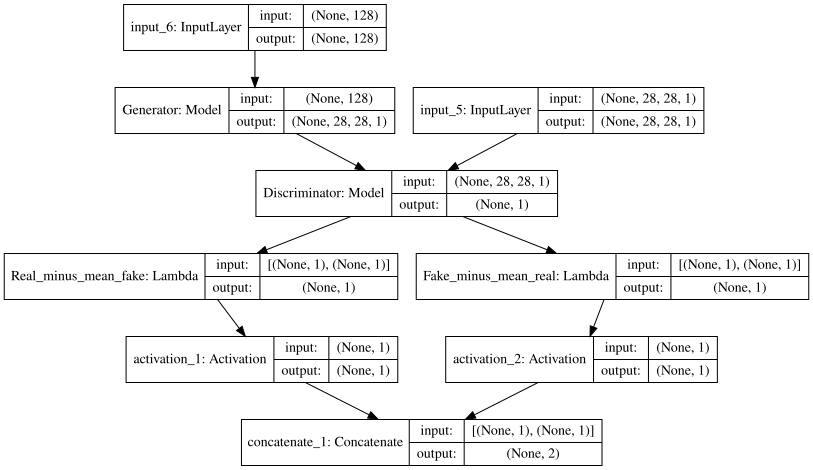

In [15]:
generator_train = Model([Noise_input, Real_image], Discriminator_Relativistic_out)
discriminator.trainable=False
generator_train.compile(OPT, loss=LOSS)
generator_train.summary()
SVG(model_to_dot(generator_train, show_shapes=True).create(prog='dot', format='svg'))

### Second, build model for train dicriminator
Remember we should make discriminator trainable and generator untrainable before we compile it

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 128)          0                                            
__________________________________________________________________________________________________
input_5 (InputLayer)            (None, 28, 28, 1)    0                                            
__________________________________________________________________________________________________
Generator (Model)               (None, 28, 28, 1)    973697      input_6[0][0]                    
__________________________________________________________________________________________________
Discriminator (Model)           (None, 1)            132417      input_5[0][0]                    
                                                                 Generator[1][0]                  
__________

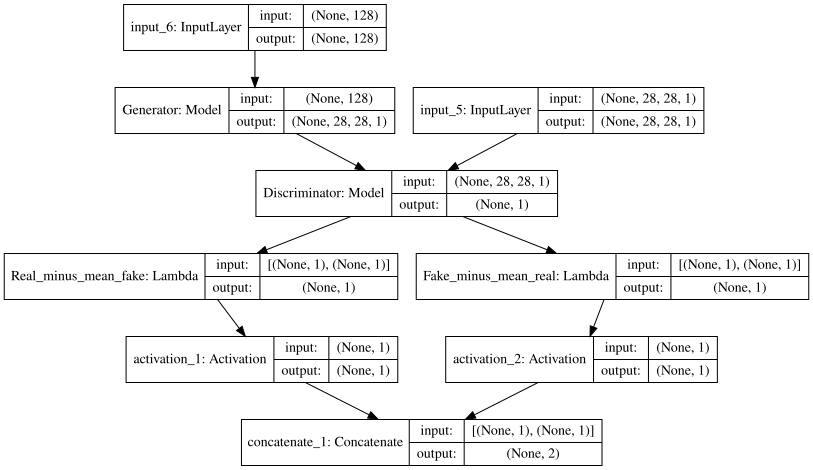

In [16]:
discriminator_train = Model([Noise_input, Real_image],Discriminator_Relativistic_out)
generator.trainable = False
discriminator.trainable=True
discriminator_train.summary()
discriminator_train.compile(OPT, loss=LOSS)
SVG(model_to_dot(discriminator_train, show_shapes=True).create(prog='dot', format='svg'))

## Generator label $y$ for fitting

In [17]:
if LOSS=='binary_crossentropy':
    true_y = np.ones((BATCHSIZE, 1), dtype=np.float32)
    fake_y = np.zeros((BATCHSIZE, 1), dtype=np.float32)
    y_for_dis = np.concatenate((true_y, fake_y), axis=1)
    y_for_gen = np.concatenate((fake_y, true_y), axis=1)
if LOSS=='mean_squared_error':
    true_y = np.ones((BATCHSIZE, 1), dtype=np.float32)
    fake_y = -np.ones((BATCHSIZE, 1), dtype=np.float32)
    y_for_dis = np.concatenate((true_y, fake_y), axis=1)
    y_for_gen = np.concatenate((fake_y, true_y), axis=1)

## Generate test noise

In [18]:
GENERATE_BATCHSIZE = GENERATE_ROW_NUM*GENERATE_ROW_NUM
test_noise = np.random.randn(GENERATE_BATCHSIZE, 128)

## Train the model

epoch 1 of 100
number of batches: 546
545/546 [============================>.] - ETA: 0s
epoch time: 16.89719533920288
plot generated_image
plot Loss


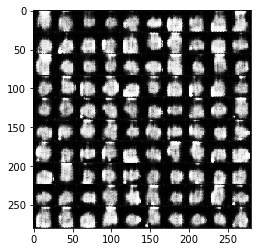

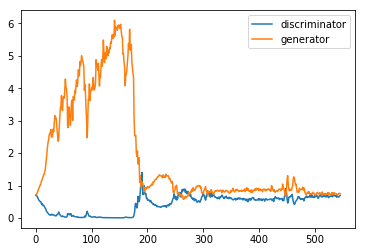

epoch 2 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.203698635101318
plot generated_image
plot Loss


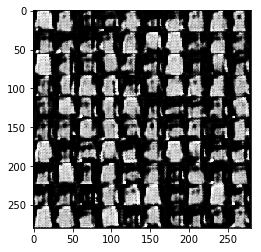

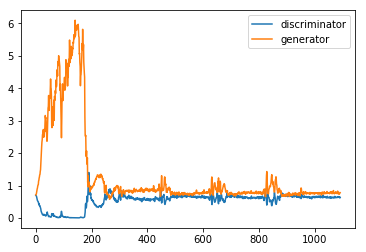

epoch 3 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.207426071166992
plot generated_image
plot Loss


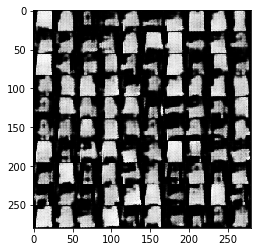

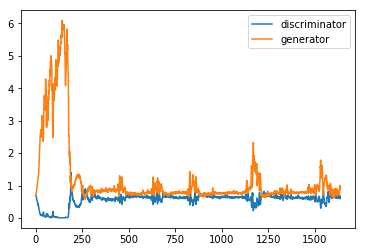

epoch 4 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.206706523895264
plot generated_image
plot Loss


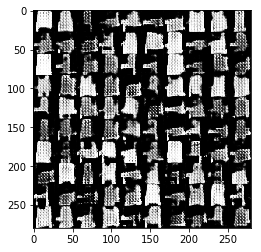

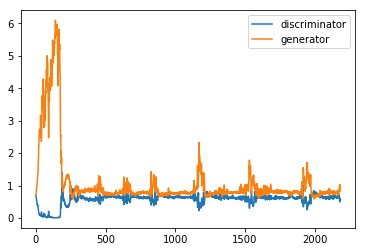

epoch 5 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.138116121292114
plot generated_image
plot Loss


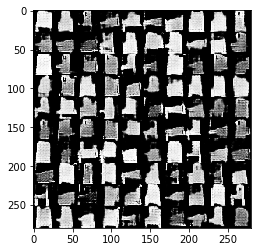

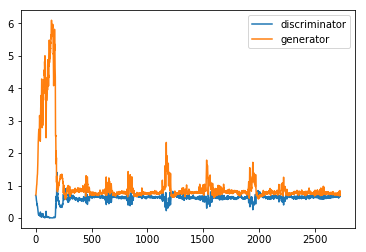

epoch 6 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.116730213165283
plot generated_image
plot Loss


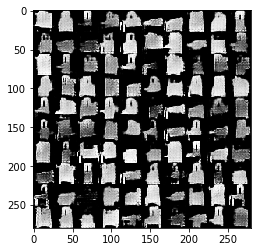

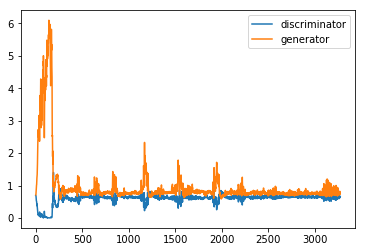

epoch 7 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.125133037567139
plot generated_image
plot Loss


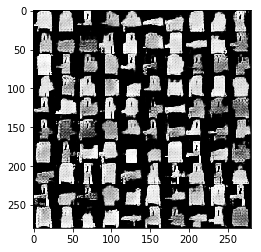

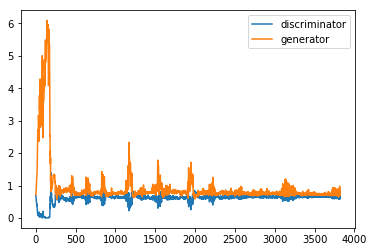

epoch 8 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.11116337776184
plot generated_image
plot Loss


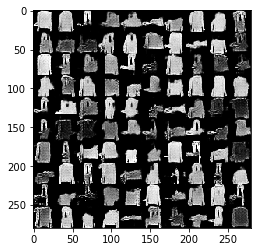

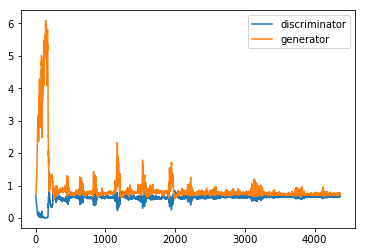

epoch 9 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.099085092544556
plot generated_image
plot Loss


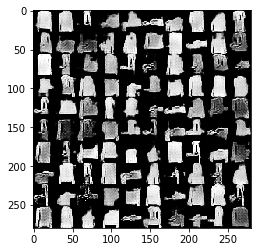

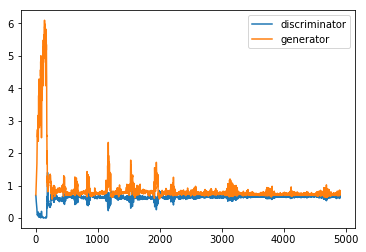

epoch 10 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.124206304550171
plot generated_image
plot Loss


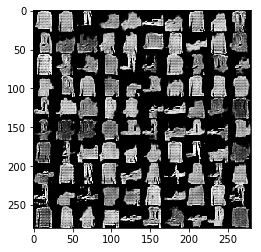

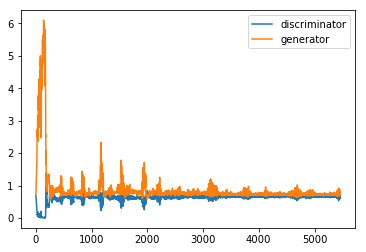

epoch 11 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.110005140304565
plot generated_image
plot Loss


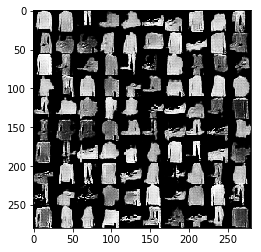

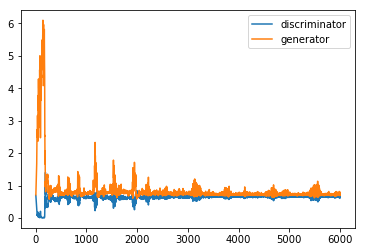

epoch 12 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.119497776031494
plot generated_image
plot Loss


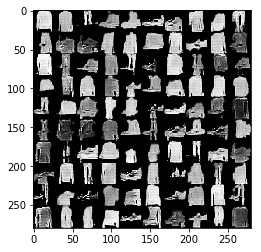

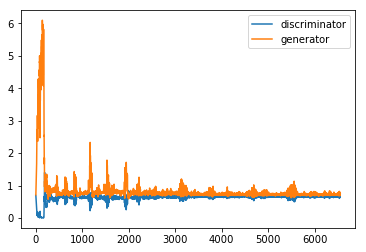

epoch 13 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.096516132354736
plot generated_image
plot Loss


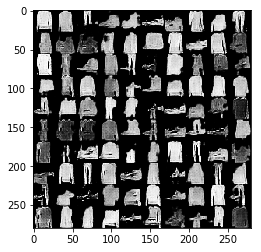

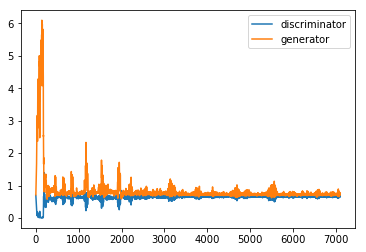

epoch 14 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.108959674835205
plot generated_image
plot Loss


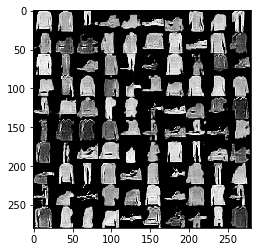

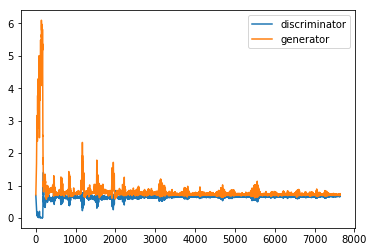

epoch 15 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.083105564117432
plot generated_image
plot Loss


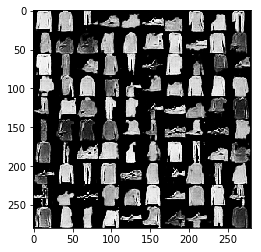

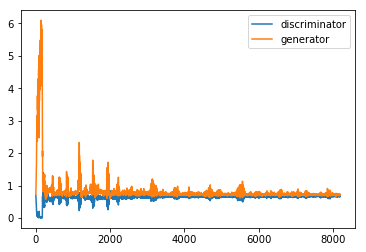

epoch 16 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.091355562210083
plot generated_image
plot Loss


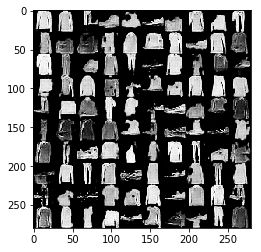

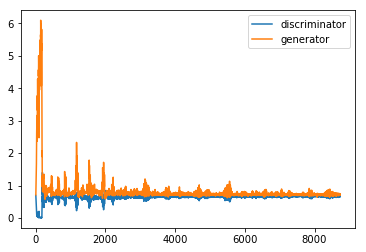

epoch 17 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.099490404129028
plot generated_image
plot Loss


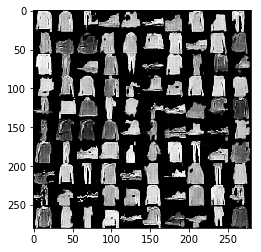

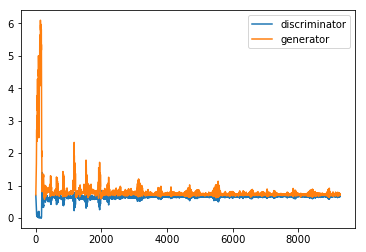

epoch 18 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.089349269866943
plot generated_image
plot Loss


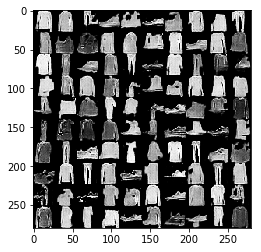

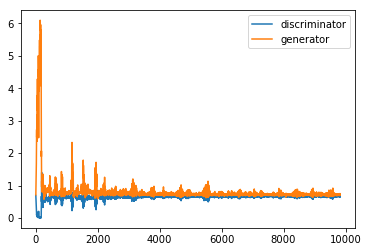

epoch 19 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.109418869018555
plot generated_image
plot Loss


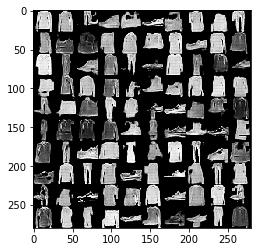

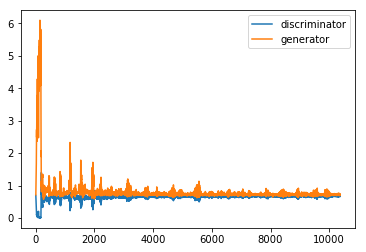

epoch 20 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.080561637878418
plot generated_image
plot Loss


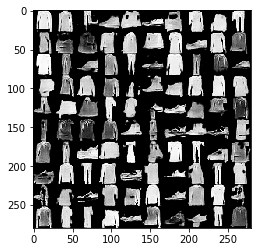

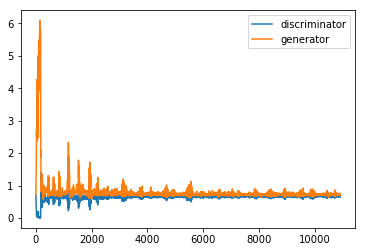

epoch 21 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.078979969024658
plot generated_image
plot Loss


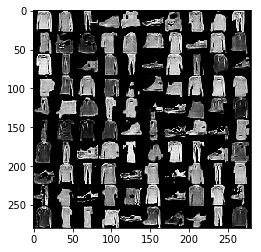

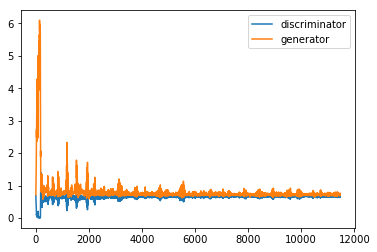

epoch 22 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.078155755996704
plot generated_image
plot Loss


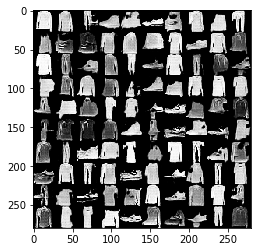

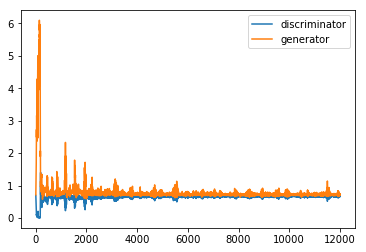

epoch 23 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.08890986442566
plot generated_image
plot Loss


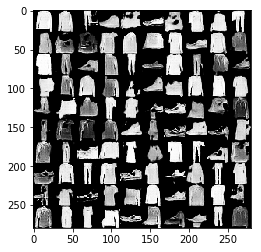

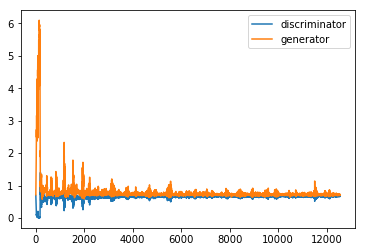

epoch 24 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.072980880737305
plot generated_image
plot Loss


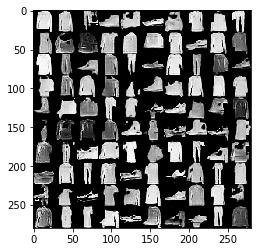

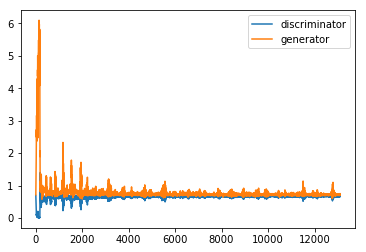

epoch 25 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.115654706954956
plot generated_image
plot Loss


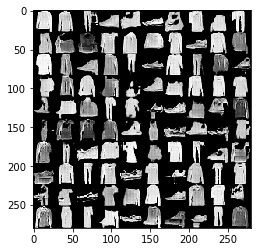

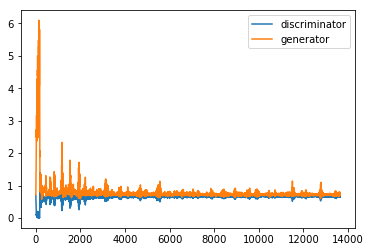

epoch 26 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.090907335281372
plot generated_image
plot Loss


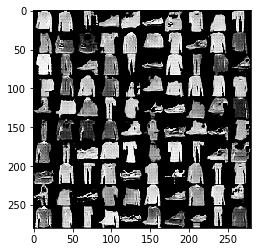

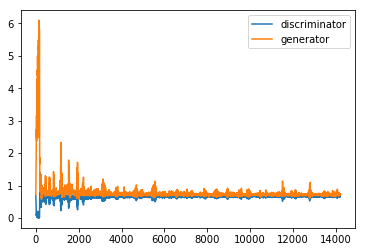

epoch 27 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.088297367095947
plot generated_image
plot Loss


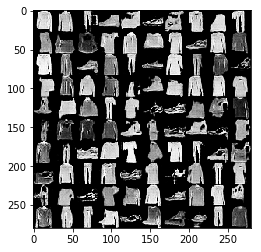

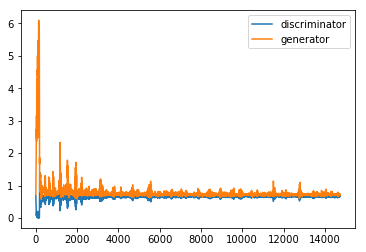

epoch 28 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.060896396636963
plot generated_image
plot Loss


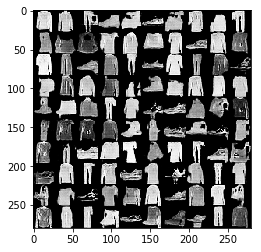

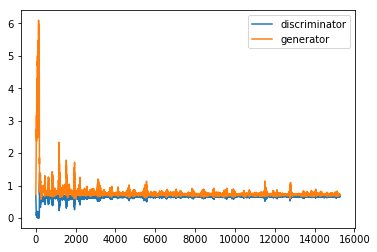

epoch 29 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.057746410369873
plot generated_image
plot Loss


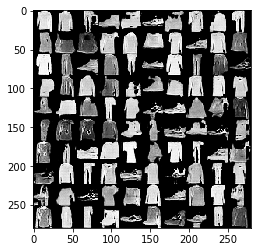

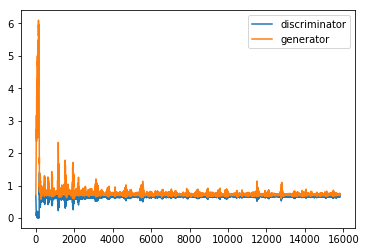

epoch 30 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.062651634216309
plot generated_image
plot Loss


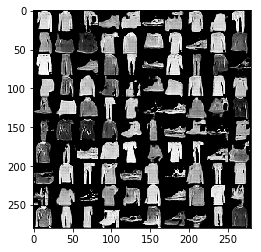

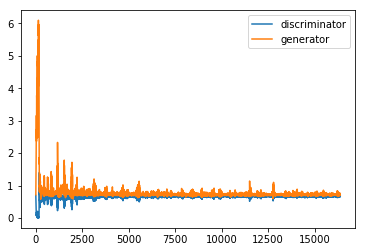

epoch 31 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.058683156967163
plot generated_image
plot Loss


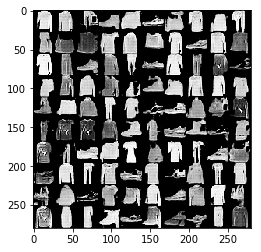

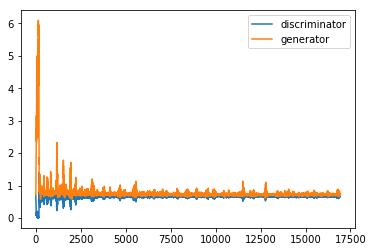

epoch 32 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.066499471664429
plot generated_image
plot Loss


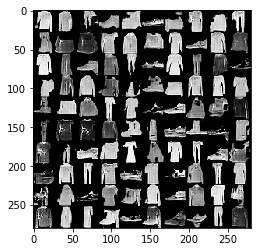

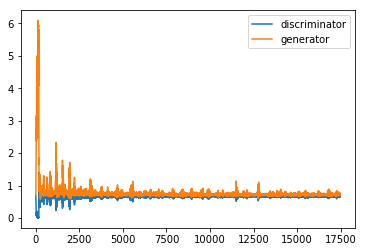

epoch 33 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.068830728530884
plot generated_image
plot Loss


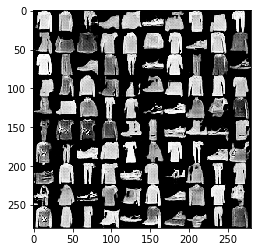

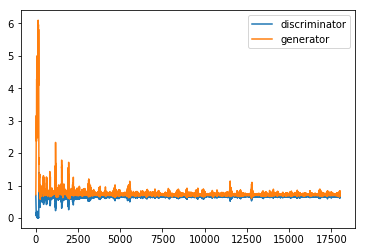

epoch 34 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.04741644859314
plot generated_image
plot Loss


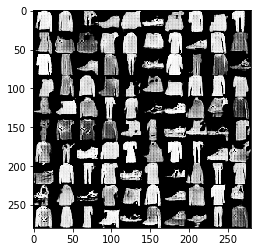

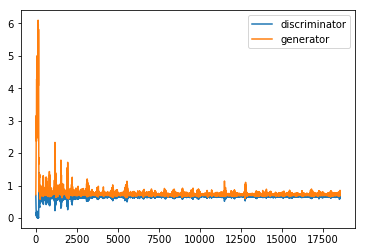

epoch 35 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.07057237625122
plot generated_image
plot Loss


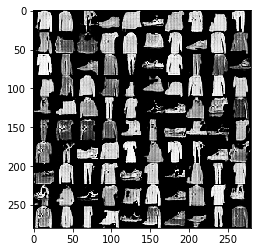

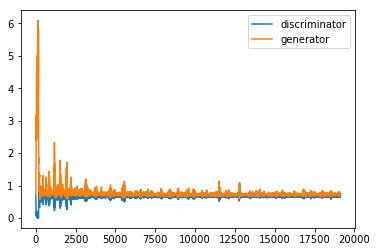

epoch 36 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.057405710220337
plot generated_image
plot Loss


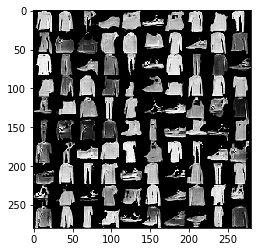

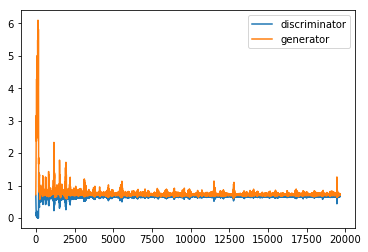

epoch 37 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.069922685623169
plot generated_image
plot Loss


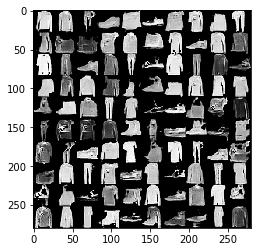

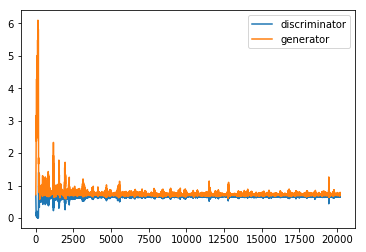

epoch 38 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.063660621643066
plot generated_image
plot Loss


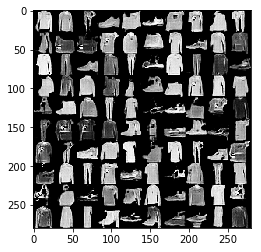

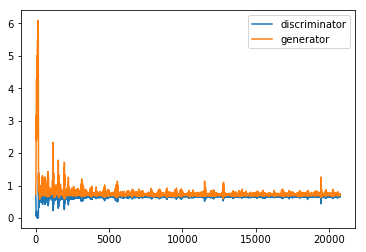

epoch 39 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.07515025138855
plot generated_image
plot Loss


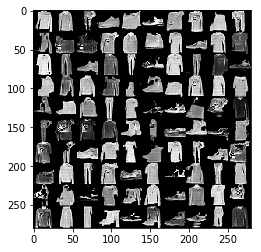

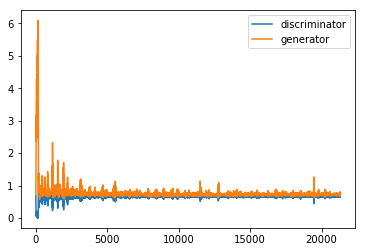

epoch 40 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.065810680389404
plot generated_image
plot Loss


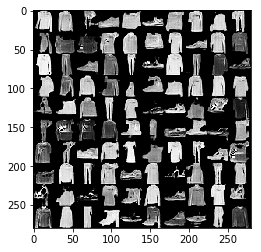

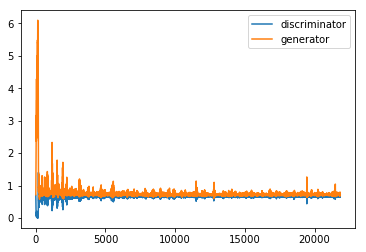

epoch 41 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.056687355041504
plot generated_image
plot Loss


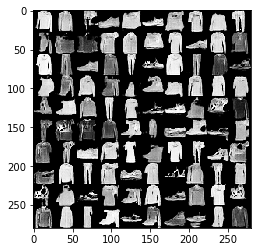

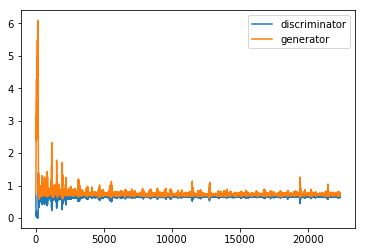

epoch 42 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.045896530151367
plot generated_image
plot Loss


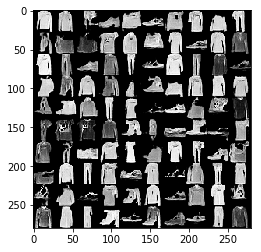

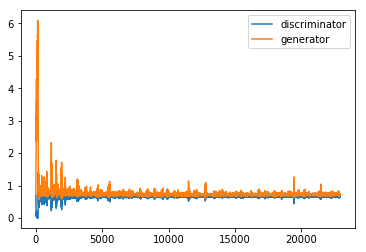

epoch 43 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.043113231658936
plot generated_image
plot Loss


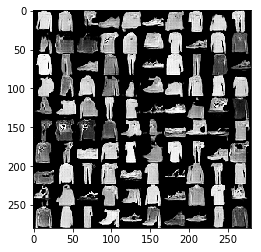

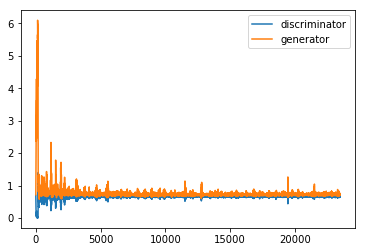

epoch 44 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.04243516921997
plot generated_image
plot Loss


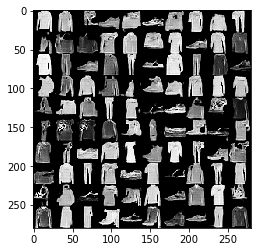

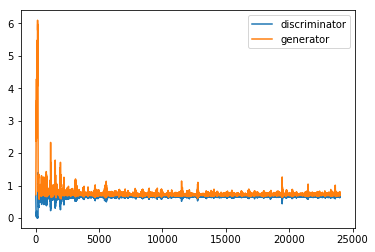

epoch 45 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.045885801315308
plot generated_image
plot Loss


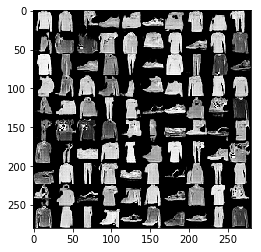

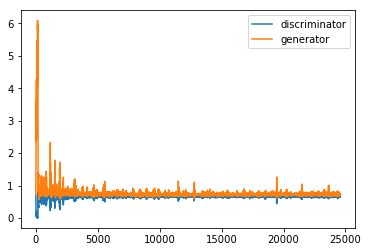

epoch 46 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.06371283531189
plot generated_image
plot Loss


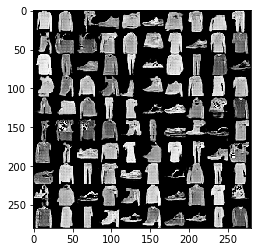

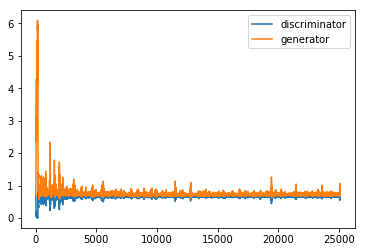

epoch 47 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.046988487243652
plot generated_image
plot Loss


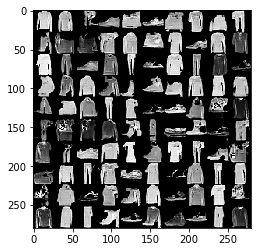

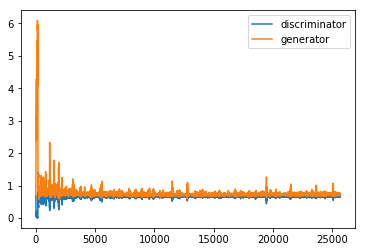

epoch 48 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.075071573257446
plot generated_image
plot Loss


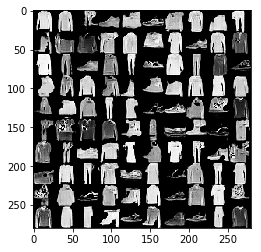

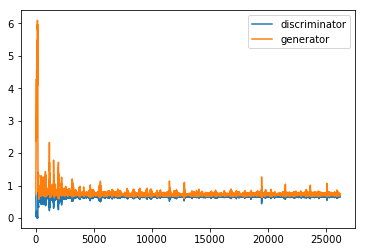

epoch 49 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.047409057617188
plot generated_image
plot Loss


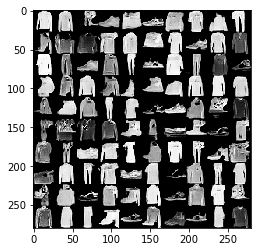

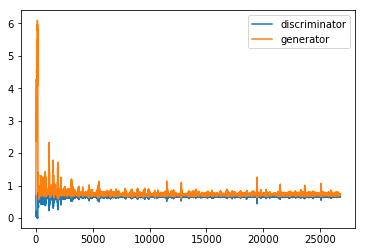

epoch 50 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.04529333114624
plot generated_image
plot Loss


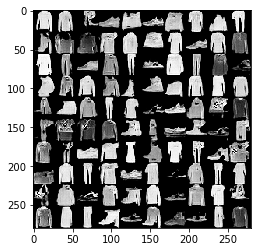

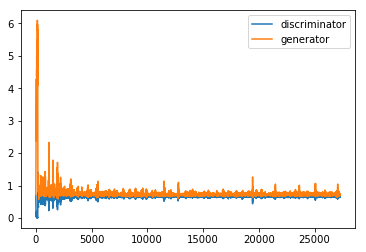

epoch 51 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.060620546340942
plot generated_image
plot Loss


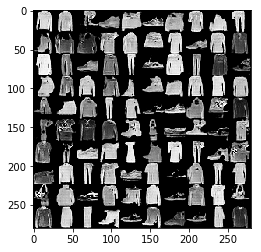

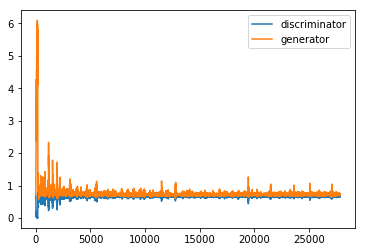

epoch 52 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.049874305725098
plot generated_image
plot Loss


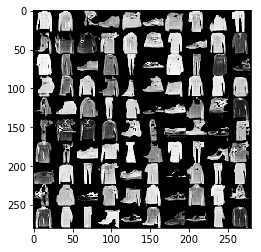

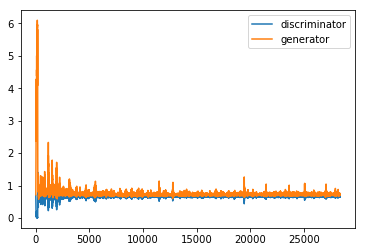

epoch 53 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.040600538253784
plot generated_image
plot Loss


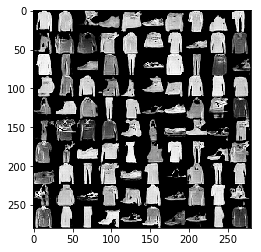

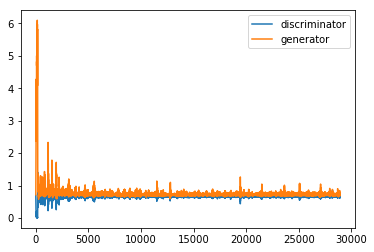

epoch 54 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.04722261428833
plot generated_image
plot Loss


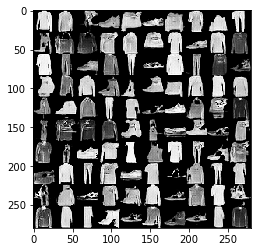

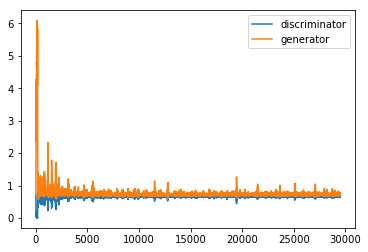

epoch 55 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.048543930053711
plot generated_image
plot Loss


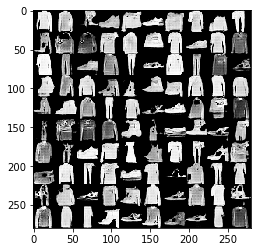

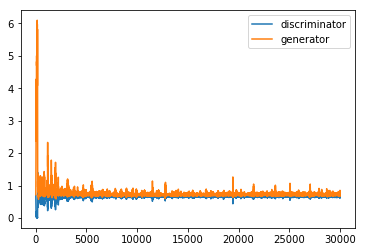

epoch 56 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.076906204223633
plot generated_image
plot Loss


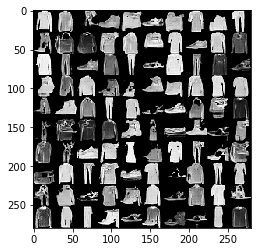

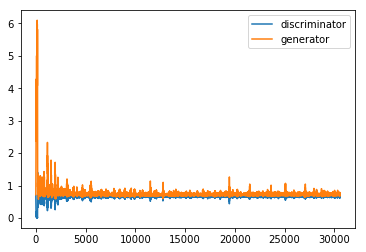

epoch 57 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.044974327087402
plot generated_image
plot Loss


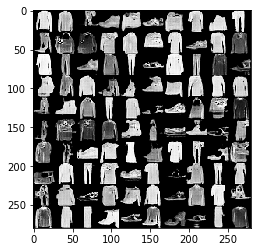

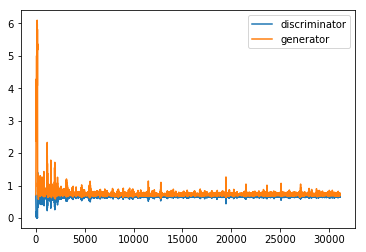

epoch 58 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.044674634933472
plot generated_image
plot Loss


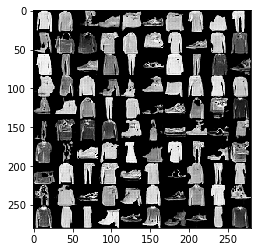

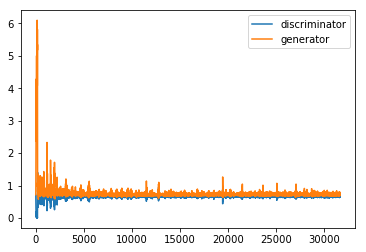

epoch 59 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.038030862808228
plot generated_image
plot Loss


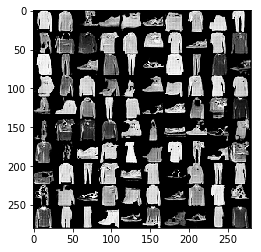

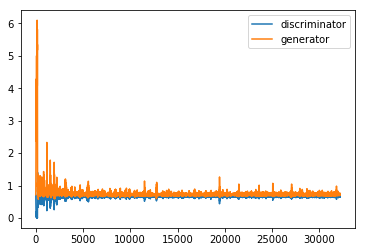

epoch 60 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.044466018676758
plot generated_image
plot Loss


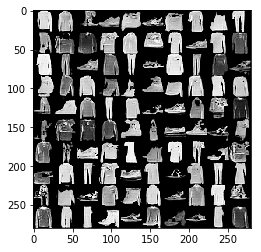

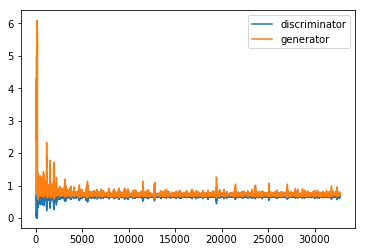

epoch 61 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.074561595916748
plot generated_image
plot Loss


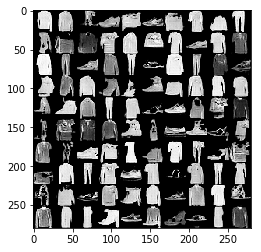

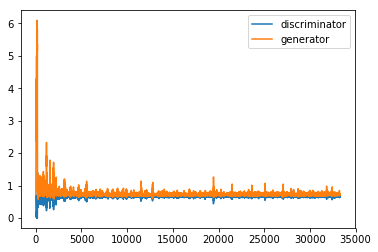

epoch 62 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.035974025726318
plot generated_image
plot Loss


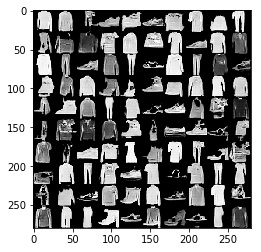

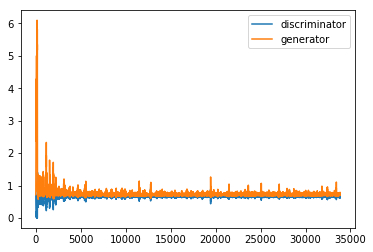

epoch 63 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.032606840133667
plot generated_image
plot Loss


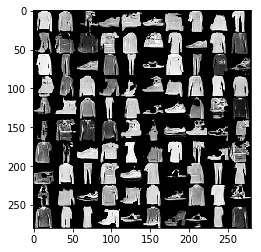

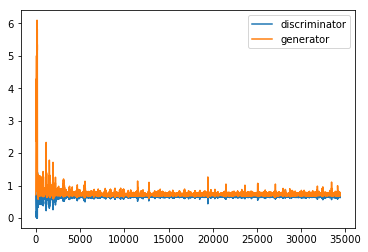

epoch 64 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.035537481307983
plot generated_image
plot Loss


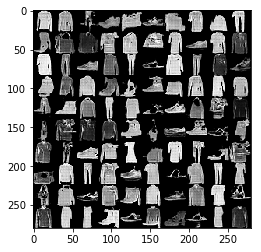

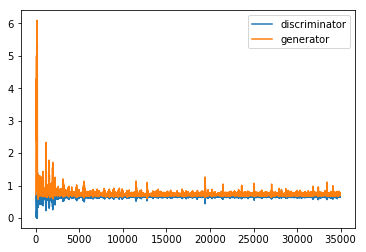

epoch 65 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.033587217330933
plot generated_image
plot Loss


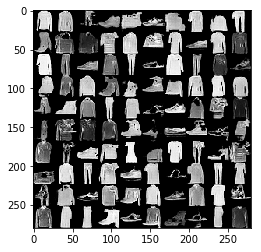

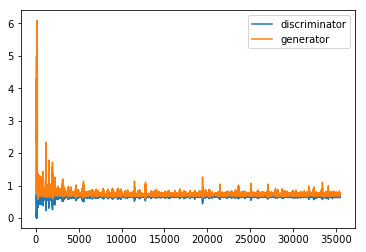

epoch 66 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.038937330245972
plot generated_image
plot Loss


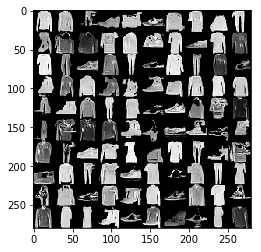

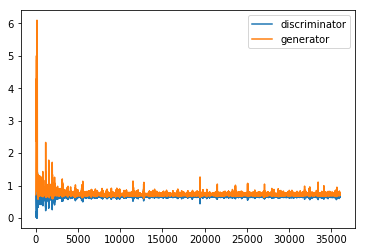

epoch 67 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.035195589065552
plot generated_image
plot Loss


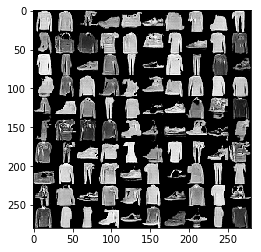

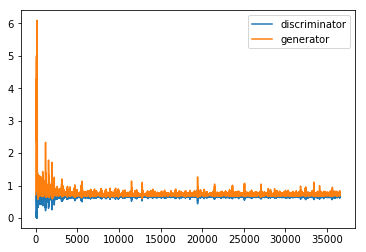

epoch 68 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.031373023986816
plot generated_image
plot Loss


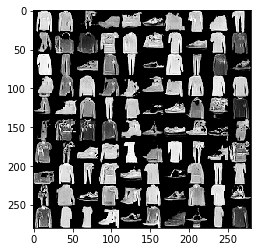

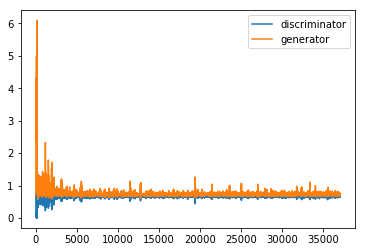

epoch 69 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.062103033065796
plot generated_image
plot Loss


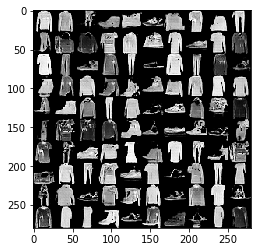

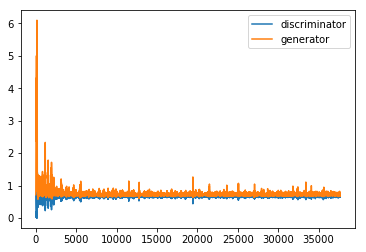

epoch 70 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.034269332885742
plot generated_image
plot Loss


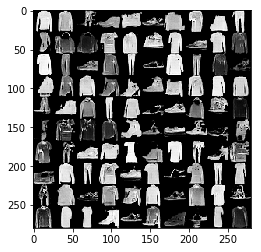

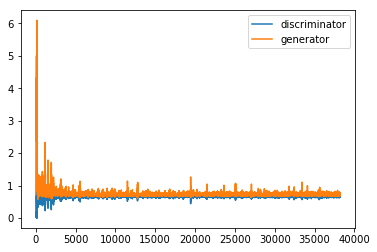

epoch 71 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.029695749282837
plot generated_image
plot Loss


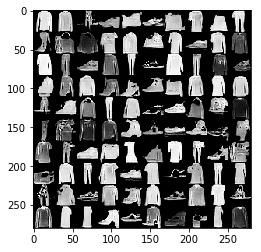

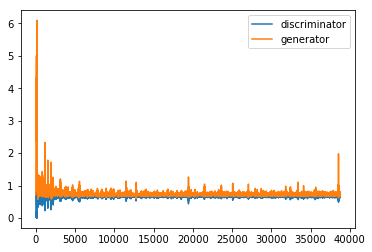

epoch 72 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.033279657363892
plot generated_image
plot Loss


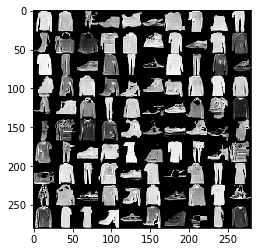

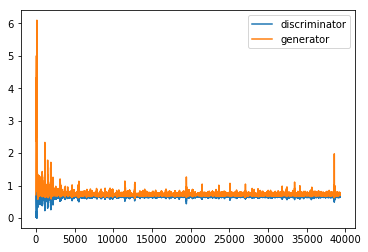

epoch 73 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.01935338973999
plot generated_image
plot Loss


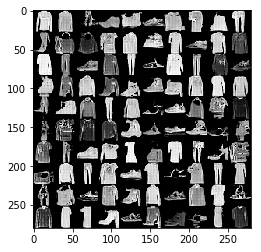

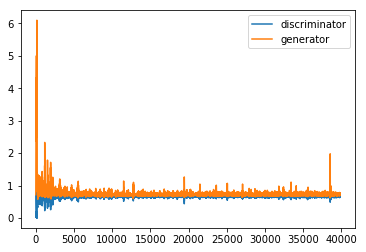

epoch 74 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.018490076065063
plot generated_image
plot Loss


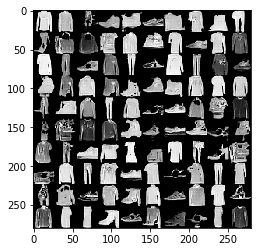

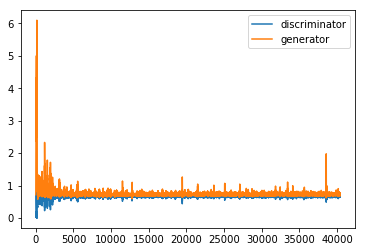

epoch 75 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.01839280128479
plot generated_image
plot Loss


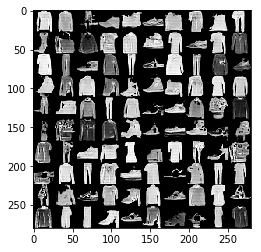

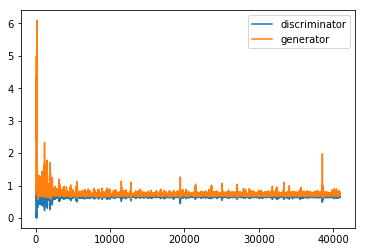

epoch 76 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.013611793518066
plot generated_image
plot Loss


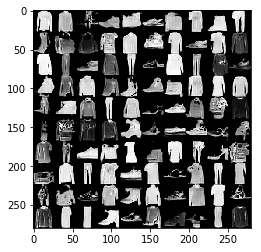

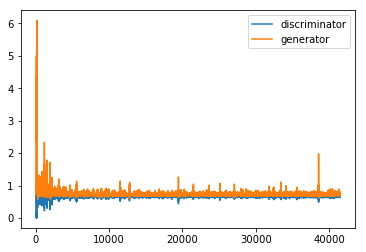

epoch 77 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.065334558486938
plot generated_image
plot Loss


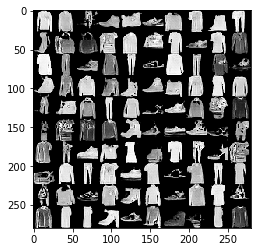

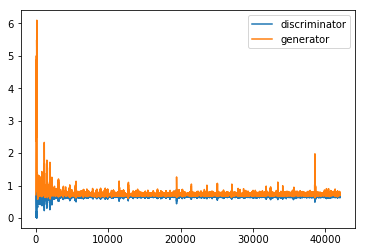

epoch 78 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.01820993423462
plot generated_image
plot Loss


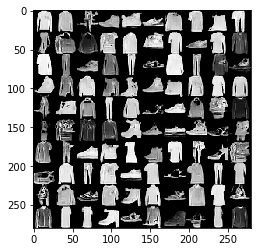

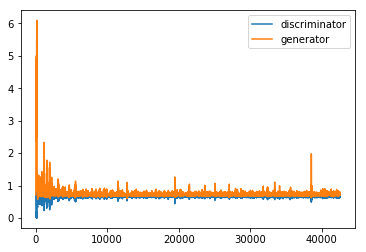

epoch 79 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.028219223022461
plot generated_image
plot Loss


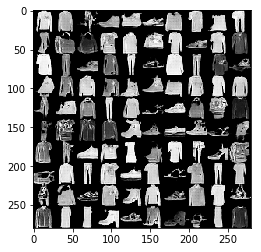

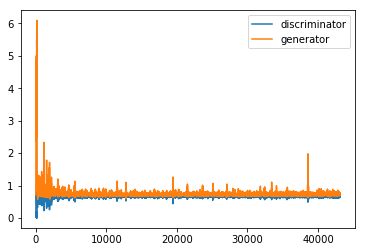

epoch 80 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.001707553863525
plot generated_image
plot Loss


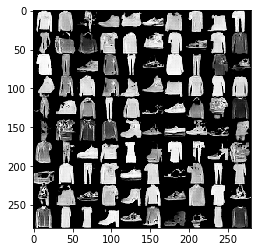

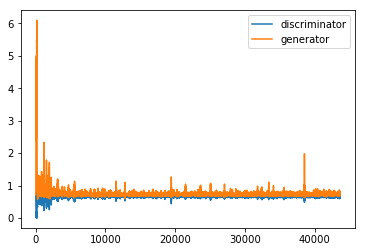

epoch 81 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.010579586029053
plot generated_image
plot Loss


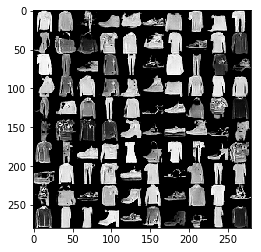

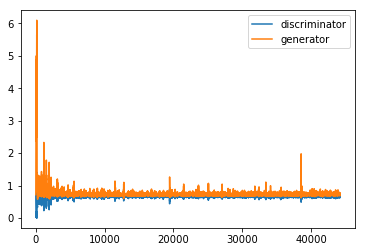

epoch 82 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.010360717773438
plot generated_image
plot Loss


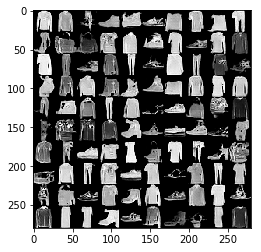

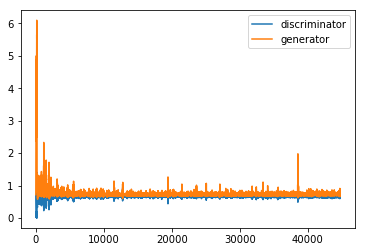

epoch 83 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.01469373703003
plot generated_image
plot Loss


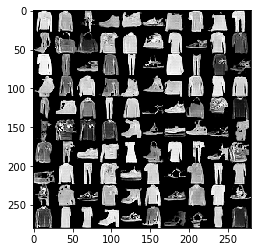

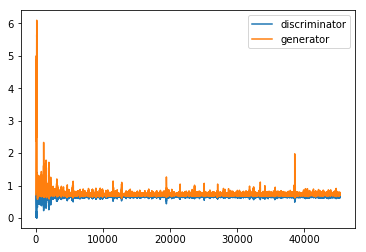

epoch 84 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.022291660308838
plot generated_image
plot Loss


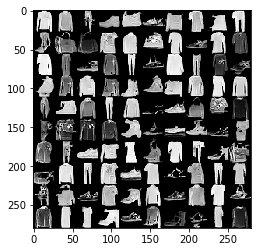

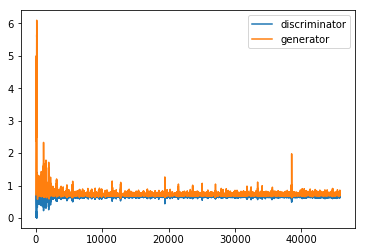

epoch 85 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.047173023223877
plot generated_image
plot Loss


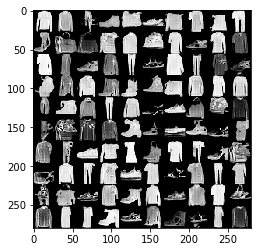

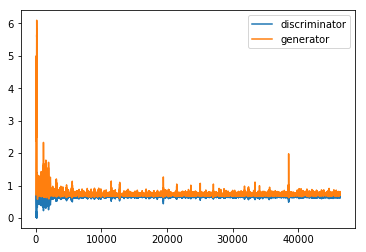

epoch 86 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.013346195220947
plot generated_image
plot Loss


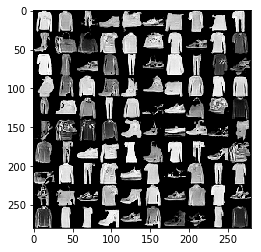

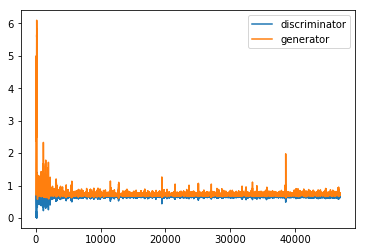

epoch 87 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.012192249298096
plot generated_image
plot Loss


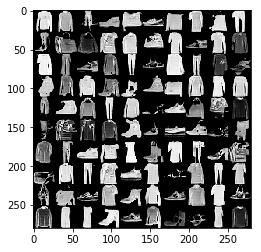

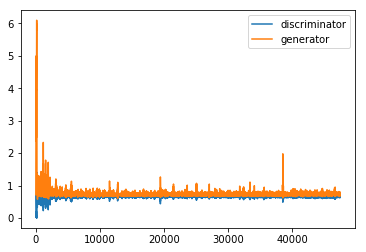

epoch 88 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.013889789581299
plot generated_image
plot Loss


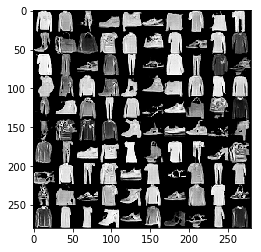

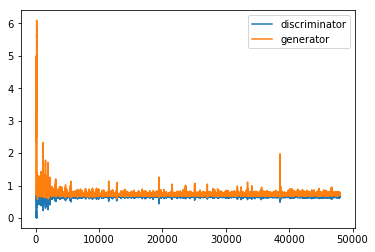

epoch 89 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.016473293304443
plot generated_image
plot Loss


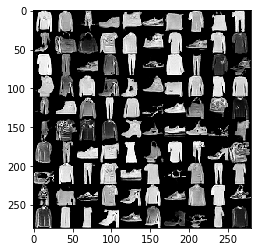

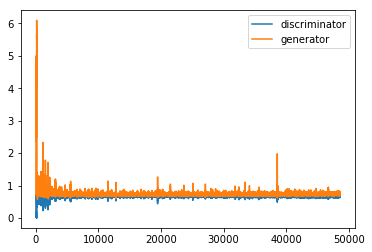

epoch 90 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.012144565582275
plot generated_image
plot Loss


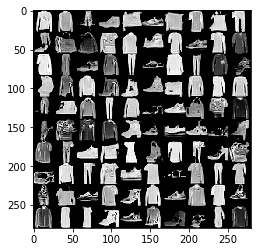

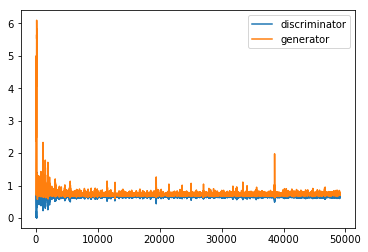

epoch 91 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.011441946029663
plot generated_image
plot Loss


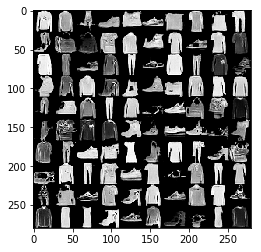

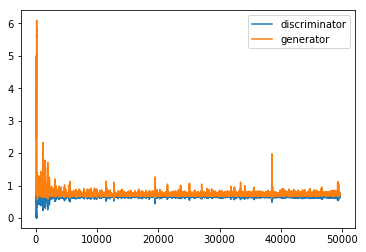

epoch 92 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.022628784179688
plot generated_image
plot Loss


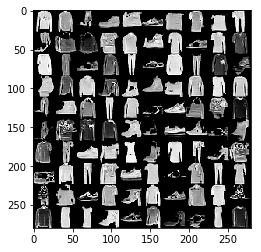

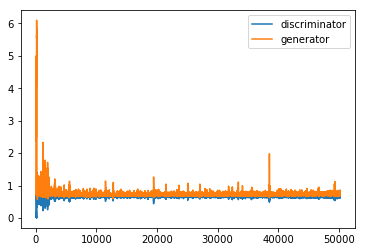

epoch 93 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.036357879638672
plot generated_image
plot Loss


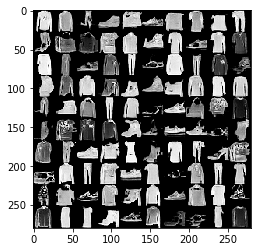

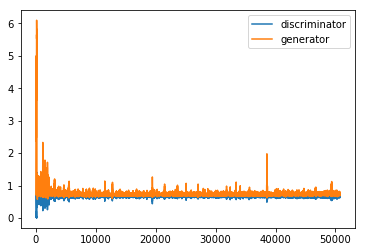

epoch 94 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.011064052581787
plot generated_image
plot Loss


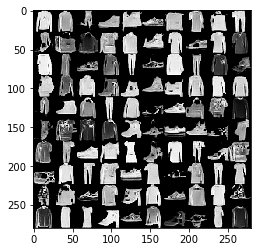

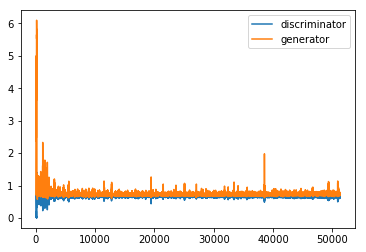

epoch 95 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.005614519119263
plot generated_image
plot Loss


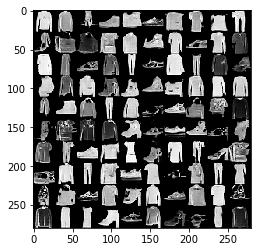

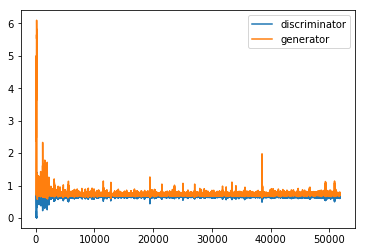

epoch 96 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.99910855293274
plot generated_image
plot Loss


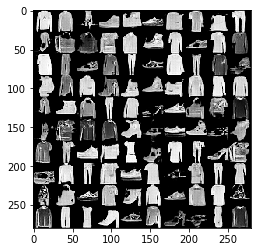

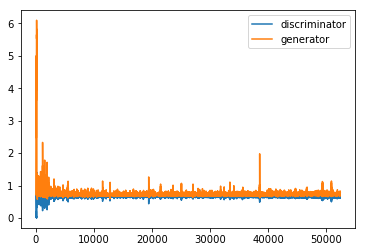

epoch 97 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.00034785270691
plot generated_image
plot Loss


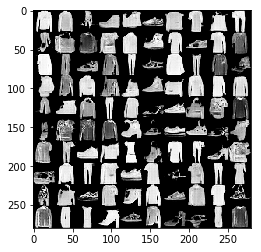

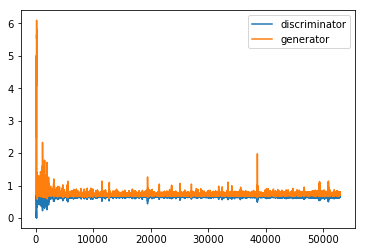

epoch 98 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.998729705810547
plot generated_image
plot Loss


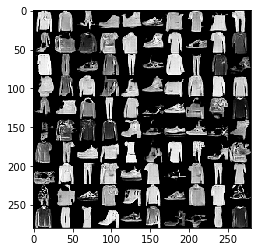

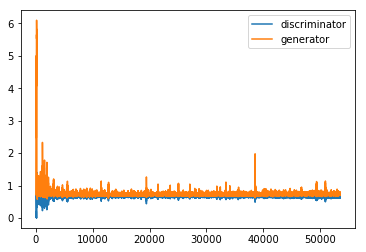

epoch 99 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 14.998383283615112
plot generated_image
plot Loss


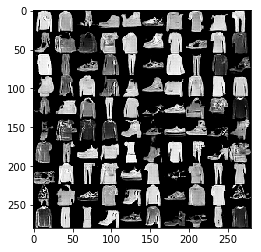

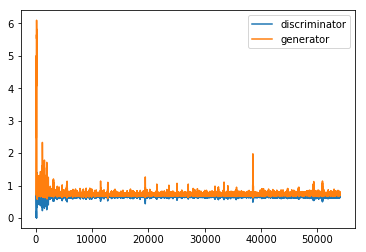

epoch 100 of 100
number of batches: 546
544/546 [============================>.] - ETA: 0s
epoch time: 15.003016710281372
plot generated_image
plot Loss


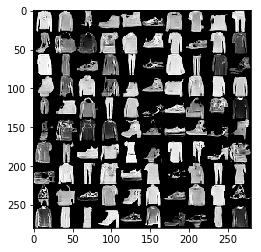

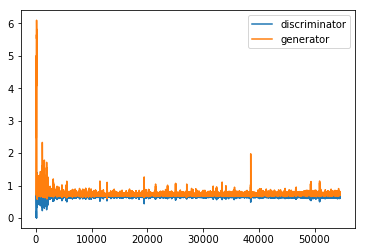

In [19]:
discriminator_loss = list()
generator_loss = list()
for epoch in range(EPOCHS):
    
    np.random.shuffle(X)

    print("epoch {} of {}".format(epoch+1, EPOCHS))
    num_batches = int(X.shape[0] // BATCHSIZE)
    minibatches_size = BATCHSIZE * (TRAINING_RATIO+1)
    print("number of batches: {}".format(int(X.shape[0] // (minibatches_size))))
    
    progress_bar = Progbar(target=int(X.shape[0] // minibatches_size))
    plt.clf()
    start_time = time()
    for index in range(int(X.shape[0] // (minibatches_size))):
        progress_bar.update(index)
        itreation_minibatches = X[index * minibatches_size:(index + 1) * minibatches_size]

        for j in range(TRAINING_RATIO):
            image_batch = itreation_minibatches[j * BATCHSIZE : (j + 1) * BATCHSIZE]
            noise = np.random.randn(BATCHSIZE, 128).astype(np.float32)
            discriminator.trainable = True
            generator.trainable = False
            discriminator_loss.append(discriminator_train.train_on_batch([noise, image_batch],y_for_dis))
            
        image_batch = itreation_minibatches[TRAINING_RATIO*BATCHSIZE : (TRAINING_RATIO + 1) * BATCHSIZE]
        noise = np.random.randn(BATCHSIZE, 128).astype(np.float32)
        discriminator.trainable = False
        generator.trainable = True
        generator_loss.append(generator_train.train_on_batch([noise, image_batch], y_for_gen))

    print('\nepoch time: {}'.format(time()-start_time))
    
    generated_image = generator.predict(test_noise)
    generated_image = (generated_image+1)/2
    for i in range(GENERATE_ROW_NUM):
        if X.shape[3]==1:
            new = generated_image[i*GENERATE_ROW_NUM:i*GENERATE_ROW_NUM+GENERATE_ROW_NUM].reshape(X.shape[2]*GENERATE_ROW_NUM,X.shape[2])
        else:
            new = generated_image[i*GENERATE_ROW_NUM:i*GENERATE_ROW_NUM+GENERATE_ROW_NUM].reshape(X.shape[2]*GENERATE_ROW_NUM,X.shape[2], 3)
        if i!=0:
            old = np.concatenate((old,new),axis=1)
        else:
            old = new
    print('plot generated_image')
    plt.figure()
    if X.shape[-1]==1:
        plt.imshow(old, cmap='gray')
    else:
        plt.imshow(old)
    print('plot Loss')
    plt.figure()
    plt.plot(discriminator_loss)
    plt.plot(generator_loss)
    plt.legend(['discriminator', 'generator'])
    plt.show()